# XGBoost Built-in Algorithm - Bike Rental Regression Example 

**Tabular regression with Amazon SageMaker XGBoost and Scikit-learn Linear Learner algorithm**

## Overview

Bike sharing systems are a means of renting bicycles where the process of obtaining membership, rental, and bike return is automated via a network of kiosk locations throughout a city. Using these systems, people are able rent a bike from a one location and return it to a different place on an as-needed basis. Currently, there are over 500 bike-sharing programs around the world.

The data generated by these systems makes them attractive for researchers because the duration of travel, departure location, arrival location, and time elapsed is explicitly recorded. Bike sharing systems therefore function as a sensor network, which can be used for studying mobility in a city. In this competition, participants are asked to combine historical usage patterns with weather data in order to forecast bike rental demand in the Capital Bikeshare program in Washington, D.C.

## Data Fields

* datetime - hourly date + timestamp  

* season:
    1. = spring,   
    2. = summer, 
    3. = fall, 
    4. = winter 
    

* holiday - whether the day is considered a holiday

* workingday - whether the day is neither a weekend nor holiday

* weather:  
    1. : Clear, Few clouds, Partly cloudy 
    2. : Mist + Cloudy, Mist + Broken clouds, Mist + Few clouds, Mist 
    3. : Light Snow, Light Rain + Thunderstorm + Scattered clouds, Light Rain + Scattered clouds 
    4. : Heavy Rain + Ice Pallets + Thunderstorm + Mist, Snow + Fog     
    
    
* temp - temperature in Celsius
* atemp - "feels like" temperature in Celsius
* humidity - relative humidity
* windspeed - wind speed
* casual - number of non-registered user rentals initiated
* registered - number of registered user rentals initiated
* count - number of total rentals

**Setup**

This notebook was created and tested on a ml.m4.xlarge notebook instance.

Let's start by updating the required packages i.e. SageMaker Python SDK, pandas and numpy, and specifying:

- The S3 bucket and prefix that you want to use for training and model data. This should be within the same region as the Notebook Instance or Studio, training, and hosting.
- The IAM role ARN used to give training and hosting access to your data. See the documentation for how to create these. Note: if more than one role is required for notebook instances, training, and/or hosting, please replace the boto regexp with the appropriate full IAM role ARN string(s).

In [1]:
import sys

!{sys.executable} -m pip install -Uq sagemaker pandas numpy statsmodels ipywidgets #  --upgrade --quiet

In [2]:
import sagemaker, boto3
from sagemaker import get_execution_role
from sagemaker import image_uris, model_uris, script_uris, hyperparameters
from sagemaker.tuner import ContinuousParameter, IntegerParameter, HyperparameterTuner
from sagemaker.estimator import Estimator
from sagemaker.utils import name_from_base

# Establish a session with AWS
sess = sagemaker.Session()
bucket = 'bikerental-xgboost'            # sess.default_bucket() # 'sagemaker-us-east-1-9...'
prefix = "sagemaker/bikerental-xgboost"  # subfolder

# Define IAM role
# This role contains the permissions needed to train, deploy models
# SageMaker Service is trusted to assume this role
aws_role = get_execution_role()

# SageMaker Boto3 Documentation: https://aws.amazon.com/sdk-for-python/
# SageMaker Python SDK Documentation:https://sagemaker.readthedocs.io/en/stable/
print(sess.boto_session)
print(sess.sagemaker_client)
print(sess.sagemaker_runtime_client)
print(sess.boto_region_name)

Session(region_name='us-east-1')
us-east-1


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import io
import os
import sys
import time
import json
from IPython.display import display
from time import strftime, gmtime
from sagemaker.inputs import TrainingInput
from sagemaker.serializers import CSVSerializer

import re
import math
import scipy.stats as st
from scipy.stats import levene
from scipy.stats import probplot as scipy_probplot
from statsmodels.graphics.gofplots import qqplot
# from probscale import probplot as probplot

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as io

## Download Data to Local, then Upload Data to S3

- https://archive.ics.uci.edu/ml/datasets/bike+sharing+dataset

In [4]:
!curl -Ls https://archive.ics.uci.edu/ml/machine-learning-databases/00275/Bike-Sharing-Dataset.zip  \
    -o Bike-Sharing-Dataset.zip  \
    | wc -l Bike-Sharing-Dataset.zip

1004 Bike-Sharing-Dataset.zip


In [5]:
!unzip -o Bike-Sharing-Dataset.zip

Archive:  Bike-Sharing-Dataset.zip
  inflating: Readme.txt              
  inflating: day.csv                 
  inflating: hour.csv                


### Reading dataset

In [6]:
df_day = pd.read_csv("day.csv")
df_day

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,727,2012-12-27,1,1,12,0,4,1,2,0.254167,0.226642,0.652917,0.350133,247,1867,2114
727,728,2012-12-28,1,1,12,0,5,1,2,0.253333,0.255046,0.590000,0.155471,644,2451,3095
728,729,2012-12-29,1,1,12,0,6,0,2,0.253333,0.242400,0.752917,0.124383,159,1182,1341
729,730,2012-12-30,1,1,12,0,0,0,1,0.255833,0.231700,0.483333,0.350754,364,1432,1796


In [7]:
df_day.isna().any().sum()

0

In [8]:
df_day.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     731 non-null    int64  
 1   dteday      731 non-null    object 
 2   season      731 non-null    int64  
 3   yr          731 non-null    int64  
 4   mnth        731 non-null    int64  
 5   holiday     731 non-null    int64  
 6   weekday     731 non-null    int64  
 7   workingday  731 non-null    int64  
 8   weathersit  731 non-null    int64  
 9   temp        731 non-null    float64
 10  atemp       731 non-null    float64
 11  hum         731 non-null    float64
 12  windspeed   731 non-null    float64
 13  casual      731 non-null    int64  
 14  registered  731 non-null    int64  
 15  cnt         731 non-null    int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 91.5+ KB


In [9]:
df_day.describe().T

,count,mean,std,min,25%,50%,75%,max
instant,731.0,366.000000,211.165812,1.000000,183.500000,366.000000,548.500000,731.000000
season,731.0,2.496580,1.110807,1.000000,2.000000,3.000000,3.000000,4.000000
yr,731.0,0.500684,0.500342,0.000000,0.000000,1.000000,1.000000,1.000000
mnth,731.0,6.519836,3.451913,1.000000,4.000000,7.000000,10.000000,12.000000
holiday,731.0,0.028728,0.167155,0.000000,0.000000,0.000000,0.000000,1.000000
weekday,731.0,2.997264,2.004787,0.000000,1.000000,3.000000,5.000000,6.000000
workingday,731.0,0.683995,0.465233,0.000000,0.000000,1.000000,1.000000,1.000000
weathersit,731.0,1.395349,0.544894,1.000000,1.000000,1.000000,2.000000,3.000000
temp,731.0,0.495385,0.183051,0.059130,0.337083,0.498333,0.655417,0.861667
atemp,731.0,0.474354,0.162961,0.079070,0.337842,0.486733,0.608602,0.840896


In [10]:
df_hour = pd.read_csv("hour.csv")
df_hour

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,2012-12-31,1,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119
17375,17376,2012-12-31,1,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89
17376,17377,2012-12-31,1,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90
17377,17378,2012-12-31,1,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,61


In [11]:
df_hour.isna().any().sum()

0

In [12]:
df_hour.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 17 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     17379 non-null  int64  
 1   dteday      17379 non-null  object 
 2   season      17379 non-null  int64  
 3   yr          17379 non-null  int64  
 4   mnth        17379 non-null  int64  
 5   hr          17379 non-null  int64  
 6   holiday     17379 non-null  int64  
 7   weekday     17379 non-null  int64  
 8   workingday  17379 non-null  int64  
 9   weathersit  17379 non-null  int64  
 10  temp        17379 non-null  float64
 11  atemp       17379 non-null  float64
 12  hum         17379 non-null  float64
 13  windspeed   17379 non-null  float64
 14  casual      17379 non-null  int64  
 15  registered  17379 non-null  int64  
 16  cnt         17379 non-null  int64  
dtypes: float64(4), int64(12), object(1)
memory usage: 2.3+ MB


In [13]:
df_hour['dteday'] = pd.to_datetime(df_hour['dteday'])

### Renaming Columns

In [14]:
df_hour = df_hour.rename(columns= {'dteday':'date', 'yr':'year', 'mnth':'month', 'hr':'hour', 
                                   'weathersit': 'weather', 'hum':'humidity', 'cnt':'count'})
df_hour.head()

,instant,date,season,year,month,hour,holiday,weekday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0,0,1,1


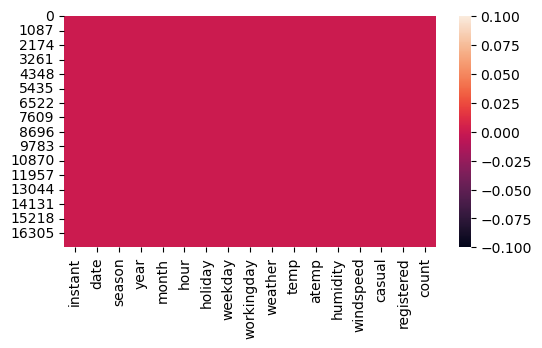

In [15]:
plt.figure(figsize=(6,3))
sns.heatmap(df_hour.isna());

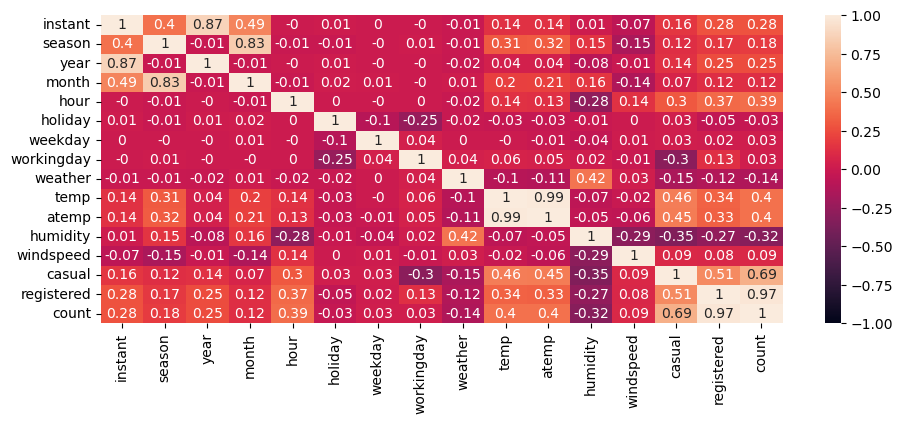

In [16]:
plt.figure(figsize=(11, 4))
sns.heatmap(df_hour.select_dtypes("number").corr().round(2), annot=True, vmin=-1)
plt.show()

- It is used to calculate how one variable is correlated/ dependent on other variable.
- Extreme values signify high correlation.
- Multicollinear variables with correlation more than a threshold are usually dropped from the dataset for Regression.

In [17]:
corr = df_hour.select_dtypes("number").corr().abs().unstack().sort_values(ascending = False)
corr[(corr > .8) & (corr < 1)].drop_duplicates()

atemp    temp          0.987672
count    registered    0.972151
instant  year          0.866014
month    season        0.830386
dtype: float64

- Here we can see that ("atemp", "temp"), ("count", "registered"), ("instant", "year") and ("month", "season") is highly correlated.
- So we can drop any one of the highly correlated feature columns.

## Univariate Analysis

In [18]:
df_hour.describe(datetime_is_numeric=True).T

,count,mean,min,25%,50%,75%,max,std
instant,17379.0,8690.0,1.0,4345.5,8690.0,13034.5,17379.0,5017.0295
date,17379,2012-01-02 04:08:34.552045568,2011-01-01 00:00:00,2011-07-04 00:00:00,2012-01-02 00:00:00,2012-07-02 00:00:00,2012-12-31 00:00:00,NaN
season,17379.0,2.50164,1.0,2.0,3.0,3.0,4.0,1.106918
year,17379.0,0.502561,0.0,0.0,1.0,1.0,1.0,0.500008
month,17379.0,6.537775,1.0,4.0,7.0,10.0,12.0,3.438776
hour,17379.0,11.546752,0.0,6.0,12.0,18.0,23.0,6.914405
holiday,17379.0,0.02877,0.0,0.0,0.0,0.0,1.0,0.167165
weekday,17379.0,3.003683,0.0,1.0,3.0,5.0,6.0,2.005771
workingday,17379.0,0.682721,0.0,0.0,1.0,1.0,1.0,0.465431
weather,17379.0,1.425283,1.0,1.0,1.0,2.0,4.0,0.639357


- temp: min is 0.02, mean value is 0.49, Median value is 0.5, max is 0.1.
- Similarly we can check for all other.

In [19]:
# Number of unique values 
df_hour.nunique()

instant       17379
date            731
season            4
year              2
month            12
hour             24
holiday           2
weekday           7
workingday        2
weather           4
temp             50
atemp            65
humidity         89
windspeed        30
casual          322
registered      776
count           869
dtype: int64

- temp: Number of unique value is 50
- Similarly we can check for all other.

### Outlier Detection

- TukeySimple: Tukey’s fences with the straightforward quantile estimation
- TukeyHd: Tukey’s fences with the Harrell-Davis quantile estimation
- MadSimple: MAD with the straightforward quantile estimation
- MadHd: MAD with the Harrell-Davis quantile estimation
- DoubleMadSimple: Double MAD with the straightforward quantile estimation
- DoubleMadHd: Double MAD with the Harrell-Davis quantile estimation

#### 'temp' feature for univariate analysis

In [20]:
df_hour[['temp']].describe().T

,count,mean,std,min,25%,50%,75%,max
temp,17379.0,0.496987,0.192556,0.02,0.34,0.5,0.66,1.0


##### (Visual Method) Create a histogram/boxplot.

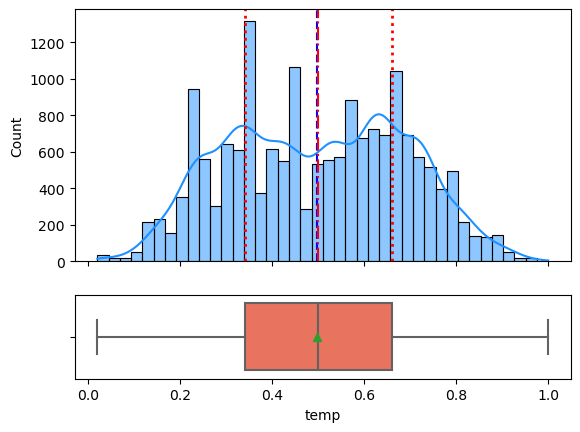

In [21]:
fig, (hist, box) = plt.subplots(nrows=2, sharex=True, gridspec_kw={'height_ratios': [3, 1]})

sns.histplot(x="temp", data=df_hour, kde=True, color='dodgerblue', ax=hist)

description = df_hour['temp'].describe()
hist.axvline(description["25%"], ls=":", lw=2, color='r')
hist.axvline(description["mean"], ls="--", color='b')
hist.axvline(description["50%"], ls="-.", color='r')
hist.axvline(description["75%"], ls=":", lw=2, color='r')

sns.boxplot(x=df_hour['temp'], showmeans=True, color='tomato', ax=box);

- All value are within 0 to 1 so it seems like normally distributed but it is Bimodal.
- Two peaks of data, usually indicates you’ve got two different groups.
- By this displot/histplot we can also see that median is ~ 0.5

#### (Visual Method) Create a Q-Q plot.

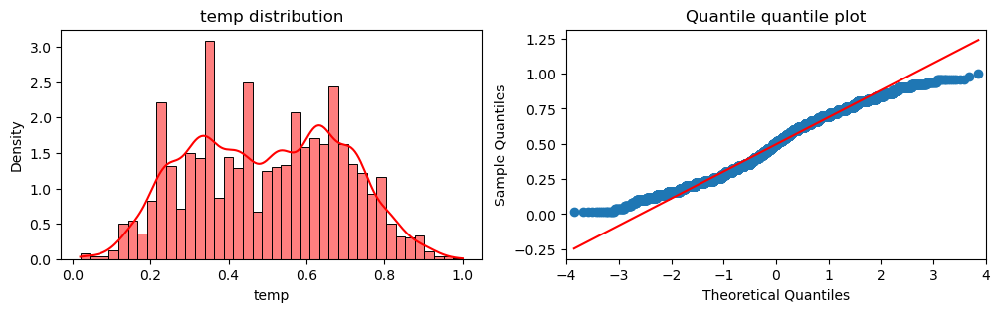

In [22]:
fig, ax = plt.subplots(ncols=2, figsize=(12, 3))

sns.histplot(df_hour['temp'], stat='density', color ='r', kde=True, ax=ax[0])
ax[0].set(title='temp distribution')

qqplot(df_hour['temp'], ax=ax[1], line='s')
ax[1].set(title='Quantile quantile plot');

- Displot, histplot, Kdeplot and QQ-Plot is used to check normality.
- Within IQR we can see that it is slightly above and below the which which means we have Bimodal data.

#### Z-Score for Outlier Detection – Python
Z-Score = (x -mean) / std. deviation = Z = (x – μ) / σ

- 68% of the data points lie between +/- 1 standard deviation.
- 95% of the data points lie between +/- 2 standard deviation
- 99.7% of the data points lie between +/- 3 standard deviation

In [23]:
# determine a threhold
threshold = 3

# detect outlier one column
for i in ['temp']: 
    z = (df_hour[i] - df_hour[i].mean()) / df_hour[i].std(ddof=0) # calculate z-score
    outlier = abs(z) > threshold  # identify outliers
        
# print outliers    
print("Z-Score outliers:", outlier.sum())

Z-Score outliers: 0


#### Tukey’s Method(Box Whisker)

- [lower/upper] = q1/q3 $\pm$ k*IQR, k$_{defaulth}$ = 1.5 

In [24]:
print("Lower threshold ", df_hour['temp'].quantile(.25) - 1.5*st.iqr(df_hour['temp']))
print("Upper threshold ", df_hour['temp'].quantile(.75) + 1.5*st.iqr(df_hour['temp']))

Lower threshold  -0.13999999999999996
Upper threshold  1.1400000000000001


In [25]:
print("Tukey’s outliers:", ((df_hour['temp']<-0.139) | (df_hour['temp']>1.140)).sum())

Tukey’s outliers: 0


#### Robust solution: the median absolute deviation (MAD)

- is defined by the following formula: MAD = C.median(|Yi – median(Yi|), 
- which is also known as the consistency constant C$_{defaulth}$ = 1.4826
- [lower/upper] = mean $\pm$ k*MAD, k$_{defaulth}$ = 3 

In [26]:
# For the normally distributed values, there is a well-known relationship between 
# the standard deviation and the median absolute deviation example below:

# calc MAD with numpy
print(1.4826 * np.median(abs(df_hour['temp'] - np.median(df_hour['temp']))))

# calc MAD with stats
print(1.4826 * st.median_abs_deviation(df_hour['temp'], scale=1.0))

# calc MAD with stats
print(st.median_abs_deviation(df_hour['temp'], scale="normal"))  # doc: "normal" == 0.67449

0.23721599999999995
0.23721599999999995
0.23721635496089627


In [27]:
print("Lower threshold ", df_hour['temp'].mean() - 3*st.median_abs_deviation(df_hour['temp'], scale="normal"))
print("Upper threshold ", df_hour['temp'].mean() + 3*st.median_abs_deviation(df_hour['temp'], scale="normal"))

Lower threshold  -0.21466189646103045
Upper threshold  1.208636233304347


In [28]:
print("MAD outliers:", ((df_hour['temp']<-0.21) | (df_hour['temp']>1.20)).sum())

MAD outliers: 0


#### the double median absolute deviation (MAD) and the Harrell-Davis quantile estimator

- https://ravenfo.com/2021/02/11/aykiri-deger-analizi/
- https://aakinshin.net/posts/harrell-davis-double-mad-outlier-detector/
- https://towardsdatascience.com/practical-guide-to-outlier-detection-methods-6b9f947a161e


- Adopting to bimodal distributions with the Harrell-Davis quantile estimator - st.mstats.hdquantiles(data)
- In the case of the normal distribution, it works the same way as the standard deviation approach. Meanwhile, it detects outliers in non-parametric distributions much better. Also, it’s more robust than Tukey’s fences because it respects all values from the given sample.

In [29]:
df_hour[['temp']].describe().T

,count,mean,std,min,25%,50%,75%,max
temp,17379.0,0.496987,0.192556,0.02,0.34,0.5,0.66,1.0


In [30]:
center     = df_hour['temp'].median()
center_hd  = st.mstats.hdmedian(df_hour['temp'])
center_hd2 = st.mstats.hdquantiles(df_hour['temp'], [.50])

center, center_hd.data, center_hd2.data

(0.5, array(0.50009683), array([0.50009683]))

In [31]:
# divide two with mwdian value
leftside  = df_hour['temp'][df_hour['temp']<center_hd]
rightside = df_hour['temp'][df_hour['temp']>center_hd]

leftside.shape, rightside.shape

((8860,), (8519,))

In [32]:
# calc two MAD
left_MAD  = st.median_abs_deviation(leftside, scale="normal")
right_MAD = st.median_abs_deviation(rightside, scale="normal")

left_MAD, right_MAD

(0.11860817748044818, 0.08895613311033619)

In [33]:
lower_threshold = df_hour['temp'].median() - 3*left_MAD
upper_threshold = df_hour['temp'].median() + 3*right_MAD

lower_threshold, upper_threshold

(0.14417546755865546, 0.7668683993310086)

In [34]:
print("Double MAD outliers:", ((df_hour['temp']<0.144) | (df_hour['temp']>0.766)).sum())

Double MAD outliers: 1534


#### Casual User's feature for univariate analysis

In [35]:
df_hour[['casual']].describe().T

,count,mean,std,min,25%,50%,75%,max
casual,17379.0,35.676218,49.30503,0.0,4.0,17.0,48.0,367.0


##### (Visual Method) Create a histogram/boxplot.

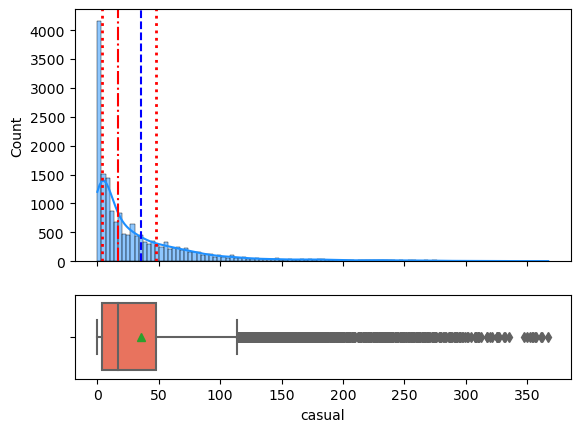

In [36]:
fig, (hist, box) = plt.subplots(nrows=2, sharex=True, gridspec_kw={'height_ratios': [3, 1]})

sns.histplot(x="casual", data=df_hour, kde=True, color='dodgerblue', ax=hist)

description = df_hour['casual'].describe()
hist.axvline(description["25%"], ls=":", lw=2, color='r')
hist.axvline(description["mean"], ls="--", color='b')
hist.axvline(description["50%"], ls="-.", color='r')
hist.axvline(description["75%"], ls=":", lw=2, color='r')

sns.boxplot(x=df_hour['casual'], showmeans=True, color='tomato', ax=box);

- Box Plot is using following IQR range
- below Q1 - 1.5*IQR
- above Q3 + 1.5*IQR


- Green dot represents mean value.


- where as outliers are present in right side means data is right skewed.
- So we will have to apply log1p (logarithm of one plus) transformation for small values to change it into normal distribution.

#### (Visual Method) Create a Q-Q plot.

In [37]:
epsilon = np.finfo(np.float32).eps

df_hour['casual_log1p'] = np.log1p(df_hour['casual']+epsilon)

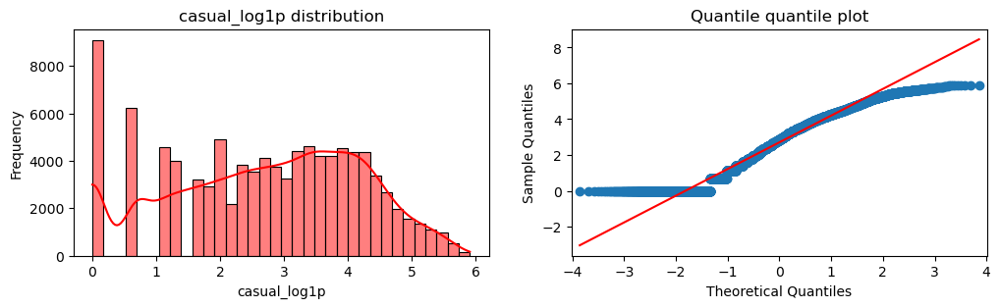

In [38]:
fig, ax = plt.subplots(ncols=2, figsize=(12, 3))

sns.histplot(df_hour['casual_log1p'], stat='frequency', color ='r', kde=True, ax=ax[0])
ax[0].set(title='casual_log1p distribution')

qqplot(df_hour['casual_log1p'], ax=ax[1], line='s')
ax[1].set(title='Quantile quantile plot');

In [39]:
df_hour['casual_log1p'].skew(), df_hour['casual_log1p'].kurtosis()

(-0.23008728250064167, -0.8784551543555432)

- Data is slightly right skewed and it is approximately symmetric distributed.

## Using Shortcut for checking Normality and Skewness using pandas skew function.

#### skewness

- If skewness is less than -1 or greater than 1, the distribution is highly skewed.
- If skewness is between -1 and -0.5 or between 0.5 and 1, the distribution is moderately skewed.
- If skewness is between -0.5 and 0.5, the distribution is approximately symmetric.

Kurtosis tells you the height and sharpness of the central peak, relative to that of a standard bell curve.

In [40]:
symmetric = []
skewed    = []
skewed_h  = []

for col in df_hour.columns.drop("date"):
    val = df_hour[col].astype(float).skew()
    if -0.5<val<0.5:
        symmetric.append(col)
    elif -1<val<1:
        skewed.append(col)
    else:
        skewed_h.append(col)  
        
print("symmetric:", symmetric) # symmetric
print("skewed   :", skewed)    # skewed
print("skewed_h :", skewed_h)  # highly skewed

symmetric: ['instant', 'season', 'year', 'month', 'hour', 'weekday', 'temp', 'atemp', 'humidity', 'casual_log1p']
skewed   : ['workingday', 'windspeed']
skewed_h : ['holiday', 'weather', 'casual', 'registered', 'count']


## Bivariate Analysis

In [41]:
io.templates.keys()

dict_keys(['ggplot2', 'seaborn', 'simple_white', 'plotly', 'plotly_white', 'plotly_dark', 'presentation', 'xgridoff', 'ygridoff', 'gridon', 'none'])

In [42]:
fig = px.bar(df_hour, x='season', y='count', color="season", template = 'presentation', barmode='group')
fig.show()

- In season 3 (fall) we have highest number of count and least in season 1 (spring).

In [43]:
def custom_legend_name(fig, names):
    for idx, name in enumerate(names):
        fig.data[idx].name = name
        fig.data[idx].hovertemplate = name
        
fig = px.box(df_hour, x="season", y="count", color="season", width=900, height=500)
custom_legend_name(fig, ['1: spring','2: summer','3: fall','4: winter'])
fig.show()

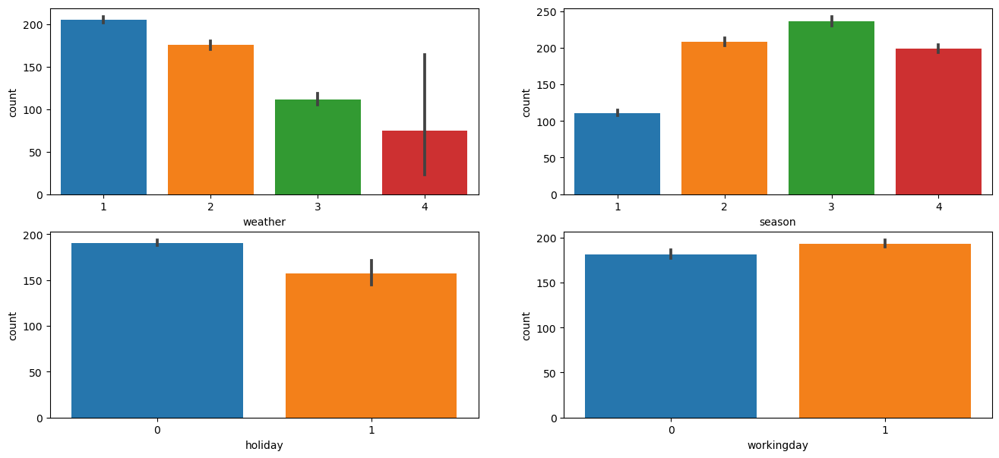

In [44]:
fig, ax = plt.subplots(2,2, figsize = (16, 7))

sns.barplot(x = 'weather', y = 'count', data = df_hour, saturation=0.90, ax = ax[0][0])
sns.barplot(x = 'season', y = 'count', data = df_hour,  saturation=0.90, ax = ax[0][1])
sns.barplot(x = 'holiday', y = 'count', data = df_hour, saturation=0.90, ax = ax[1][0])
sns.barplot(x = 'workingday', y = 'count', data = df_hour, saturation=0.90, ax = ax[1][1]);

- weather vs Count: When weather is 1 (Clear, Few clouds, Partly cloudy) then count is highest.
- season vs Count: In season 3 ( fall ) we have highest number of count & least in 1 (springer).
- holiday vs Count In holiday (1) time we have least number of count.
- workingday vs Count In working day ( Neighter holiday/ weekend) we have highest number of count.

In [45]:
fig = px.histogram(df_hour, x = "temp", facet_row = "season", template = 'plotly_white', 
                   nbins=16, text_auto=True, height=800)  # , histfunc="count"
fig.show ()

- `In season 1 (spring) when temp ranges from 0.15 to 0.24 and 0.25 to 0.34 then we have highest number of count.`
- `In season 2 (summer) when temp ranges from 0.55 to 0.64 then we have highest number of count.`
- `In season 3 (fall)   when temp ranges from 0.65 to 0.74 then we have highest number of count.`
- `In season 4 (winter) when temp ranges from 0.35 to 0.44 then we have highest number of count.`

In [46]:
fig = px.histogram(df_hour, x = "temp", facet_row = "workingday", template = 'plotly_white',
                   nbins=16, text_auto=True,)
fig.show ()

- `In workingday 0 when temp ranges from 0.35 to 0.44 then we have highest number of count.`
- `In workingday 1 when temp ranges from 0.55 to 0.64 then we have highest number of count.`

In [47]:
fig = make_subplots(
    rows=1, cols=3,
    subplot_titles=("workingday", "weather", "season"), 
    column_widths=[0.25, 0.5, 0.25],
    specs=[[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}]])

fig.add_trace(px.pie(df_hour, names = "workingday", hole = 0.3).data[0], row=1, col=1)
fig.add_trace(px.pie(df_hour, names = "weather", hole = 0.4).data[0], row=1, col=2)
fig.add_trace(px.pie(df_hour, names = "season", hole = 0.3).data[0], row=1, col=3)
fig.show ()

- From weather 1 we have highest number of count.
- From weather 3 we have least number of count.

In [48]:
fig = make_subplots(
    rows=2, cols=1,
    subplot_titles=("ols", "lowess"), 
    vertical_spacing=0.1,
    row_heights=[0.5, 0.5])

fig.add_trace(px.scatter (df_hour, x = "count", y = "temp", color = "season", trendline="ols").data[0], row=1, col=1)
fig.add_trace(px.scatter (df_hour, x = "count", y = "temp", color = "season", trendline="lowess").data[0], row=2, col=1)
fig.update_layout(height=800, width=900, title_text="temp trendline", template = "presentation",)
fig.update_layout(coloraxis=dict(colorscale='Viridis'))
fig.show ()

## Multivariate Analysis

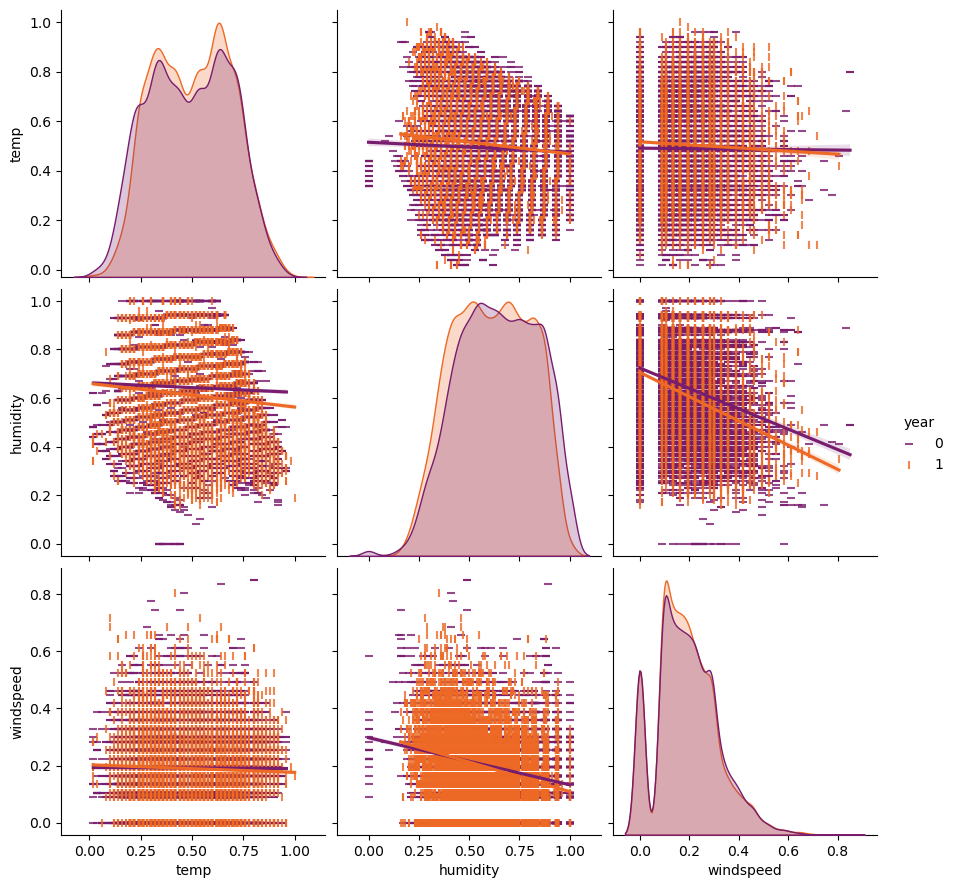

In [49]:
sns.pairplot(data=df_hour, vars=['temp', 'humidity', 'windspeed'],
             hue='year', kind='reg', diag_kind='kde', markers=['_','|'], height=3, 
             palette="inferno");

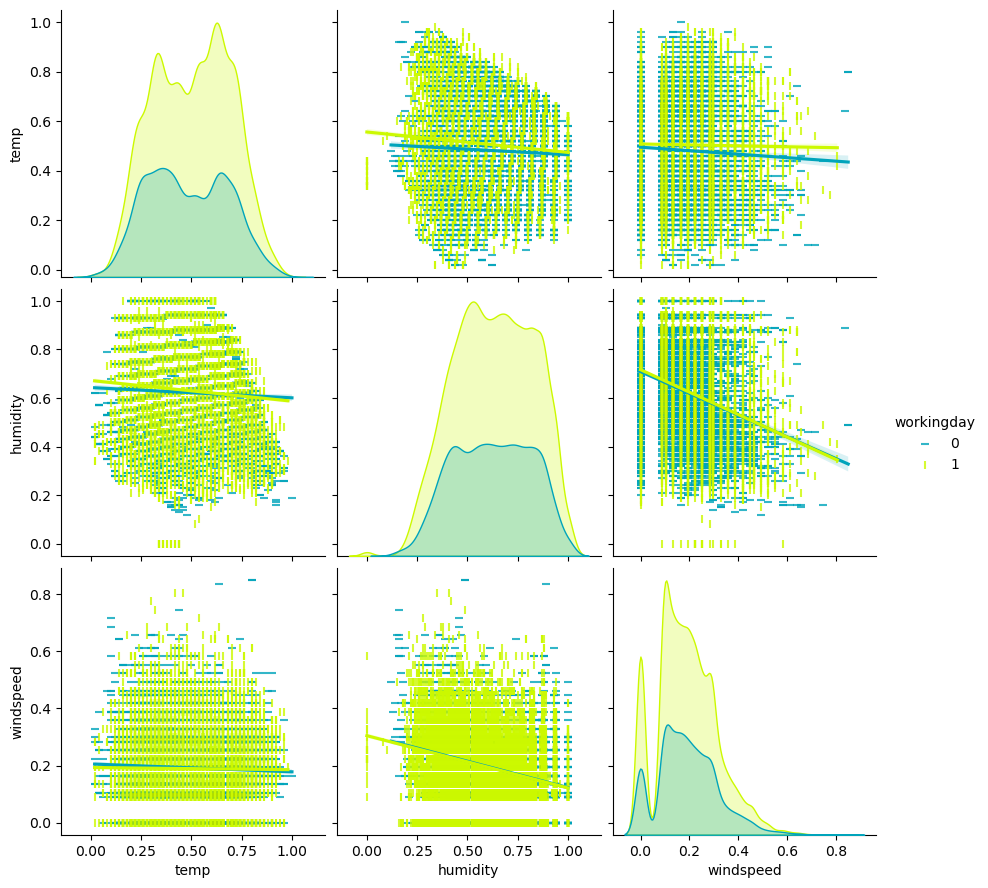

In [50]:
sns.pairplot(data=df_hour, vars=['temp', 'humidity', 'windspeed'], 
             hue='workingday', kind='reg', diag_kind='kde', markers=['_','|'], height=3, 
             palette='nipy_spectral');

In [51]:
df_hour

,instant,date,season,year,month,hour,holiday,weekday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,casual_log1p
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16,1.386294e+00
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40,2.197225e+00
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32,1.791759e+00
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13,1.386294e+00
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1,1.192093e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,2012-12-31,1,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119,2.484907e+00
17375,17376,2012-12-31,1,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89,2.197225e+00
17376,17377,2012-12-31,1,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90,2.079442e+00
17377,17378,2012-12-31,1,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,61,2.639057e+00


In [52]:
# Dropping the necessary columns 
df = df_hour.drop(columns=['instant', 'atemp', 'date', 'year', 'casual_log1p']).reset_index(drop=True)

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17379 entries, 0 to 17378
Data columns (total 13 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   season      17379 non-null  int64  
 1   month       17379 non-null  int64  
 2   hour        17379 non-null  int64  
 3   holiday     17379 non-null  int64  
 4   weekday     17379 non-null  int64  
 5   workingday  17379 non-null  int64  
 6   weather     17379 non-null  int64  
 7   temp        17379 non-null  float64
 8   humidity    17379 non-null  float64
 9   windspeed   17379 non-null  float64
 10  casual      17379 non-null  int64  
 11  registered  17379 non-null  int64  
 12  count       17379 non-null  int64  
dtypes: float64(3), int64(10)
memory usage: 1.7 MB


In [54]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
season,17379.0,2.501640,1.106918,1.00,2.0000,3.000,3.0000,4.0000
month,17379.0,6.537775,3.438776,1.00,4.0000,7.000,10.0000,12.0000
hour,17379.0,11.546752,6.914405,0.00,6.0000,12.000,18.0000,23.0000
holiday,17379.0,0.028770,0.167165,0.00,0.0000,0.000,0.0000,1.0000
weekday,17379.0,3.003683,2.005771,0.00,1.0000,3.000,5.0000,6.0000
workingday,17379.0,0.682721,0.465431,0.00,0.0000,1.000,1.0000,1.0000
weather,17379.0,1.425283,0.639357,1.00,1.0000,1.000,2.0000,4.0000
temp,17379.0,0.496987,0.192556,0.02,0.3400,0.500,0.6600,1.0000
humidity,17379.0,0.627229,0.192930,0.00,0.4800,0.630,0.7800,1.0000
windspeed,17379.0,0.190098,0.122340,0.00,0.1045,0.194,0.2537,0.8507


# Data Pre-Processing

Now that we've cleaned up our dataset, let's determine which algorithm to use. Amazon SageMaker provides an XGBoost container that we can use to train in a managed, distributed setting, and then host as a real-time prediction endpoint. XGBoost uses gradient boosted trees which naturally account for non-linear relationships between features and the target variable, as well as accommodating complex interactions between features.

Amazon SageMaker XGBoost can train on data in either a CSV or LibSVM format. For this example, we'll stick with CSV. It should:

- Have the predictor variable in the first column
- Not have a header row

But first, let's convert our categorical features into numeric features.

In [55]:
from sklearn.model_selection import train_test_split
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, LabelEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.pipeline import Pipeline

from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

## Features and Target variable Split

In [56]:
X = df.drop(columns=['casual', 'registered', 'count'])
y = df[['count']]

In [57]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((15641, 10), (15641, 1), (1738, 10), (1738, 1))

In [58]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

X_train.shape, y_train.shape, X_val.shape

((12512, 10), (12512, 1), (3129, 10))

### OrdinalEncoder 

In [59]:
cat = ['season', 'month', 'weather']

column_trans = make_column_transformer(
    (OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1), cat),
    remainder = MinMaxScaler()
)

In [60]:
pd.concat([y_train, X_train], axis=1)

,count,season,month,hour,holiday,weekday,workingday,weather,temp,humidity,windspeed
10794,220,2,3,21,0,5,1,1,0.38,0.66,0.1343
1637,147,1,3,18,0,0,0,1,0.40,0.43,0.3582
13133,210,3,7,10,0,5,1,1,0.86,0.30,0.0000
11954,515,2,5,7,0,5,1,1,0.46,0.82,0.1045
2807,105,2,5,21,0,0,0,2,0.46,0.82,0.0000
...,...,...,...,...,...,...,...,...,...,...,...
12785,243,3,6,22,0,4,1,1,0.80,0.63,0.1642
13753,185,3,8,6,0,3,1,1,0.64,0.78,0.1343
11504,595,2,4,13,0,0,0,1,0.50,0.45,0.1045
2923,553,2,5,17,0,5,1,1,0.58,0.40,0.3582


In [61]:
train_data      = pd.DataFrame(np.hstack([y_train, column_trans.fit_transform(X_train)]),
                       columns=np.append(['count'], column_trans.get_feature_names_out()))
validation_data = pd.DataFrame(np.hstack([y_val, column_trans.transform(X_val)]),
                       columns=np.append(['count'], column_trans.get_feature_names_out()))
test_data       = pd.DataFrame(column_trans.transform(X_test), columns=column_trans.get_feature_names_out())

train_data.shape, validation_data.shape, test_data.shape, 

((12512, 11), (3129, 11), (1738, 10))

In [62]:
train_data

,count,ordinalencoder__season,ordinalencoder__month,ordinalencoder__weather,remainder__hour,remainder__holiday,remainder__weekday,remainder__workingday,remainder__temp,remainder__humidity,remainder__windspeed
0,220.0,1.0,2.0,0.0,0.913043,0.0,0.833333,1.0,0.375000,0.66,0.157870
1,147.0,0.0,2.0,0.0,0.782609,0.0,0.000000,0.0,0.395833,0.43,0.421065
2,210.0,2.0,6.0,0.0,0.434783,0.0,0.833333,1.0,0.875000,0.30,0.000000
3,515.0,1.0,4.0,0.0,0.304348,0.0,0.833333,1.0,0.458333,0.82,0.122840
4,105.0,1.0,4.0,1.0,0.913043,0.0,0.000000,0.0,0.458333,0.82,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
12507,243.0,2.0,5.0,0.0,0.956522,0.0,0.666667,1.0,0.812500,0.63,0.193018
12508,185.0,2.0,7.0,0.0,0.260870,0.0,0.500000,1.0,0.645833,0.78,0.157870
12509,595.0,1.0,3.0,0.0,0.565217,0.0,0.000000,0.0,0.500000,0.45,0.122840
12510,553.0,1.0,4.0,0.0,0.739130,0.0,0.833333,1.0,0.583333,0.40,0.421065


In [63]:
train_data.to_csv("train.csv", header=False, index=False)
validation_data.to_csv("validation.csv", header=False, index=False)
test_data.to_csv("test.csv", header=False, index=False)

## Upload Data to S3

- Now we'll upload these files to S3.

In [64]:
os.path.join(prefix, "training/train.csv")

'sagemaker/bikerental-xgboost/training/train.csv'

In [65]:
boto3.Session().resource("s3").Bucket(bucket).Object(os.path.join(prefix, "training/train.csv")
                                                    ).upload_file("train.csv")

boto3.Session().resource("s3").Bucket(bucket).Object(os.path.join(prefix, "validation/validation.csv")
                                                    ).upload_file("validation.csv")

boto3.Session().resource("s3").Bucket(bucket).Object(os.path.join(prefix, "test/test.csv")
                                                    ).upload_file("test.csv")

In [66]:
conn = boto3.client('s3')
contents = conn.list_objects(Bucket=bucket, Prefix=prefix)['Contents']

for f in contents:
    print(f['Key'])

sagemaker/bikerental-xgboost/test/test.csv
sagemaker/bikerental-xgboost/training/train.csv
sagemaker/bikerental-xgboost/validation/validation.csv


# Retrieve Training Artifacts

___

Here, we retrieve the training docker container, the training algorithm source, and the tabular algorithm. Note that model_version="*" fetches the latest model.

For the training algorithm, we have two choices in this demonstration.
* [XGBoost](https://xgboost.readthedocs.io/en/latest/): To use this algorithm, specify `train_model_id` as `xgboost-regression-model` in the cell below.
* [Linear Learner](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html#sklearn.linear_model.LogisticRegression): To use this algorithm, specify `train_model_id` as `sklearn-regression-linear` in the cell below.


Note. [LightGBM](https://lightgbm.readthedocs.io/en/latest/) (`train_model_id: lightgbm-regression-model`), [CatBoost](https://catboost.ai/en/docs/) (`train_model_id:catboost-regression-model`), [TabTransformer](https://arxiv.org/abs/2012.06678) (`train_model_id: pytorch-regression-model`), and [AutoGluon Tabular](https://auto.gluon.ai/stable/tutorials/tabular_prediction/index.html) (`train_model_id: autogluon-regression-ensemble`) are the other choices in the tabular regression category. Since they have different input-format requirements, please check separate notebooks `lightgbm_catboost_tabular/Amazon_Tabular_Regression_LightGBM_CatBoost.ipynb`, `tabtransformer_tabular/Amazon_Tabular_Regression_TabTransformer.ipynb`, and `autogluon_tabular/Amazon_Tabular_Regression_AutoGluon.ipynb` for details.


---

## Training Algorithm Docker Image

- Moving onto training, first we'll need to specify the locations of the XGBoost algorithm containers.

In [67]:
# https://sagemaker.readthedocs.io/en/stable/api/utility/image_uris.html#sagemaker.image_uris.retrieve
#https://sagemaker.readthedocs.io/en/stable/api/utility/session.html

# SDK 2 uses image_uris.retrieve the container image location

from sagemaker import image_uris, model_uris, script_uris

train_model_id, train_model_version, train_scope = "xgboost-regression-model", "*", "training"
training_instance_type = "ml.m5.xlarge"

# Retrieve the docker image
train_image_uri = image_uris.retrieve(
    region=sess.boto_region_name,
    framework=None,
    model_id=train_model_id,
    model_version=train_model_version,
    image_scope=train_scope,
    instance_type=training_instance_type,
)
# Retrieve the training script
train_source_uri = script_uris.retrieve(
    model_id=train_model_id, model_version=train_model_version, script_scope=train_scope
)
# Retrieve the pre-trained model tarball to further fine-tune
train_model_uri = model_uris.retrieve(
    model_id=train_model_id, model_version=train_model_version, model_scope=train_scope
)
print (f'Using XGBoost Container: {train_model_uri}')

Using XGBoost Container: s3://jumpstart-cache-prod-us-east-1/xgboost-training/train-xgboost-regression-model.tar.gz


## Set Training Parameters

---
Now that we are done with all the setup that is needed, we are ready to train our tabular algorithm. To begin, let us create a [``sageMaker.estimator.Estimator``](https://sagemaker.readthedocs.io/en/stable/api/training/estimators.html) object. This estimator will launch the training job. 

There are two kinds of parameters that need to be set for training. The first one are the parameters for the training job. These include: (i) Training data path. This is S3 folder in which the input data is stored, (ii) Output path: This the s3 folder in which the training output is stored. (iii) Training instance type: This indicates the type of machine on which to run the training.

The second set of parameters are algorithm specific training hyper-parameters. 

---

### Specify Training Data Location and Optionally, Validation Data Location

- Then, because we're training with the CSV file format, we'll create TrainingInputs that our training function can use as a pointer to the files in S3.

In [74]:
# content type can be libsvm or csv for XGBoost

s3_input_train = TrainingInput(
    s3_data="s3://{}/{}/training".format(bucket, prefix), content_type="csv", s3_data_type='S3Prefix'
)

s3_input_validation = TrainingInput(
    s3_data="s3://{}/{}/validation/".format(bucket, prefix), content_type="csv", s3_data_type='S3Prefix'
)

data_channels = {'training': s3_input_train, 'validation': s3_input_validation}

In [69]:
print(s3_input_train.config)
print(s3_input_validation.config)
print(s3_input_test.config)

{'DataSource': {'S3DataSource': {'S3DataType': 'S3Prefix', 'S3Uri': 's3://bikerental-xgboost/sagemaker/bikerental-xgboost/training', 'S3DataDistributionType': 'FullyReplicated'}}, 'ContentType': 'csv'}
{'DataSource': {'S3DataSource': {'S3DataType': 'S3Prefix', 'S3Uri': 's3://bikerental-xgboost/sagemaker/bikerental-xgboost/validation/', 'S3DataDistributionType': 'FullyReplicated'}}, 'ContentType': 'csv'}
{'DataSource': {'S3DataSource': {'S3DataType': 'S3Prefix', 'S3Uri': 's3://bikerental-xgboost/sagemaker/bikerental-xgboost/test/', 'S3DataDistributionType': 'FullyReplicated'}}, 'ContentType': 'csv'}


---
For algorithm specific hyper-parameters, we start by fetching python dictionary of the training hyper-parameters that the algorithm accepts with their default values. This can then be overridden to custom values.

---

In [70]:
# Specify hyper parameters that appropriate for the training algorithm
# XGBoost Training Parameter Reference
# https://docs.aws.amazon.com/sagemaker/latest/dg/xgboost_hyperparameters.html

from sagemaker import hyperparameters

# Retrieve the default hyper-parameters for fine-tuning the model
hyperparameters = hyperparameters.retrieve_default(
    model_id=train_model_id, model_version=train_model_version
)

# [Optional] Override default hyperparameters with custom values
hyperparameters["num_boost_round"] = "500"
print(hyperparameters)

{'num_boost_round': '500', 'early_stopping_rounds': '30', 'learning_rate': '0.3', 'gamma': '0', 'min_child_weight': '1', 'max_depth': '6', 'subsample': '1', 'colsample_bytree': '1', 'reg_lambda': '1', 'reg_alpha': '0'}


## Train with Automatic Model Tuning


Amazon SageMaker automatic model tuning, also known as hyperparameter tuning, finds the best version of a model by running many training jobs on your dataset using the algorithm and ranges of hyperparameters that you specify. It then chooses the hyperparameter values that result in a model that performs the best, as measured by a metric that you choose. We will use a HyperparameterTuner object to interact with Amazon SageMaker hyperparameter tuning APIs. 

In [71]:
from sagemaker.tuner import ContinuousParameter, IntegerParameter, HyperparameterTuner

use_amt = True

if train_model_id == "xgboost-regression-model":
    hyperparameter_ranges = {
        "num_round": IntegerParameter(1000, 10000),
        "lambda": IntegerParameter(1, 50),
        "colsample_bytree": ContinuousParameter(0, 1),
        "alpha": IntegerParameter(1, 50),
        "subsample": ContinuousParameter(0, 1),
        "min_child_weight": IntegerParameter(1, 50),
        "max_delta_step": IntegerParameter(1, 50),
        "gamma": IntegerParameter(1, 50),
        "eta": ContinuousParameter(0.01, 1, scaling_type="Logarithmic"),
        "max_depth": IntegerParameter(1, 10),
    }


elif train_model_id == "sklearn-regression-linear":
    hyperparameter_ranges = {
        "alpha": ContinuousParameter(1e-6, 1, scaling_type="Logarithmic"),
        "tol": ContinuousParameter(1e-6, 1e-1, scaling_type="Logarithmic"),
        "l1_ratio": ContinuousParameter(0, 1),
    }

## Start Training

### SageMaker maintains a separate image for algorithm and region

In [72]:
# Use Spot Instance - Save up to 90% of training cost by using spot instances when compared to on-demand instances
# Reference: https://aws.amazon.com/ec2/spot/

# if you are still on two-month free-tier you can use the on-demand instance by setting:
# use_spot_instances = False

# We will use spot for training
use_spot_instances = False
max_run  = 360000 # in seconds
max_wait = 7200 if use_spot_instances else None # in seconds

checkpoint_s3_uri = None

#if use_spot_instances:
 #   checkpoint_s3_uri = f's3://{bucket_name}/bikerental/checkpoints/{job_name}'
    
#print (f'Checkpoint uri: {checkpoint_s3_uri}')

### Build Model
---
We start by creating the estimator object with all the required assets and then launch the training job.

---

In [75]:
# Configure the training job
# Specify type and number of instances to use
# 50 hours of m4.xlarge or m5.xlarge instances
# S3 location where final artifacts needs to be stored


# for managed spot training, specify the use_spot_instances flag, max_run, max_wait and checkpoint_s3_uri


from sagemaker.estimator import Estimator
from sagemaker.utils import name_from_base

job_name = 'xgboost-bikerental'
training_job_name = name_from_base(f"{job_name}")

# Create SageMaker Estimator instance
tabular_estimator = Estimator(
    role=aws_role,
    image_uri=train_image_uri,
    source_dir=train_source_uri,
    model_uri=train_model_uri,
    entry_point="transfer_learning.py",
    instance_count=1,
    instance_type=training_instance_type,
    max_run=max_run,
    max_wait=max_wait,
    hyperparameters=hyperparameters,
    output_path="s3://{}/{}/output".format(bucket, prefix),
    use_spot_instances=use_spot_instances,
    checkpoint_s3_uri=checkpoint_s3_uri,
    sagemaker_session=sess,
    base_job_name = job_name,
)

if use_amt:
    if train_model_id == "xgboost-regression-model":

        tuner = HyperparameterTuner(
            tabular_estimator,
            "validation:rmse",
            hyperparameter_ranges,
            max_jobs=10,
            max_parallel_jobs=2,
            objective_type="Minimize",
            base_tuning_job_name=training_job_name,
        )

    elif train_model_id == "sklearn-regression-linear":

        tuner = HyperparameterTuner(
            tabular_estimator,
            "mse",
            hyperparameter_ranges,
            [{"Name": "mse", "Regex": "mean_squared_error: ([0-9\\.]+)"}],
            max_jobs=10,
            max_parallel_jobs=2,
            objective_type="Minimize",
            base_tuning_job_name=training_job_name,
        )

    tuner.fit(data_channels, logs=True)
else:
    # Launch a SageMaker Training job by passing s3 path of the training data
    tabular_estimator.fit(
        data_channels, logs=True, job_name=training_job_name
    )    
# XGBoost supports "train", "validation" channels
# Reference: Supported versions of xgboost algorithm
# https://docs.aws.amazon.com/sagemaker/latest/dg/ecr-us-east-1.html#xgboost-us-east-1.title

No finished training job found associated with this estimator. Please make sure this estimator is only used for building workflow config


.............................................................................!


### Train with Automatic Model Tuning

In [76]:
conn = boto3.client('s3')
contents = conn.list_objects(Bucket=bucket, Prefix=prefix)['Contents']

for f in contents:
    print(f['Key'])

sagemaker/bikerental-xgboost/output/xgboost-bikerental-2-230125-2340-001-c030b8a3/output/model.tar.gz
sagemaker/bikerental-xgboost/output/xgboost-bikerental-2-230125-2340-002-019d13de/output/model.tar.gz
sagemaker/bikerental-xgboost/output/xgboost-bikerental-2-230125-2340-003-a4d9407c/output/model.tar.gz
sagemaker/bikerental-xgboost/output/xgboost-bikerental-2-230125-2340-004-7c53c233/output/model.tar.gz
sagemaker/bikerental-xgboost/output/xgboost-bikerental-2-230125-2340-005-239431ac/output/model.tar.gz
sagemaker/bikerental-xgboost/output/xgboost-bikerental-2-230125-2340-006-1694d4c8/output/model.tar.gz
sagemaker/bikerental-xgboost/output/xgboost-bikerental-2-230125-2340-007-11721f92/output/model.tar.gz
sagemaker/bikerental-xgboost/output/xgboost-bikerental-2-230125-2340-008-1c67086c/output/model.tar.gz
sagemaker/bikerental-xgboost/output/xgboost-bikerental-2-230125-2340-009-b7ca60be/output/model.tar.gz
sagemaker/bikerental-xgboost/output/xgboost-bikerental-2-230125-2340-010-fae83f86/

## Deploy and Run Inference on the Trained Tabular Model
---

In this section, you learn how to query an existing endpoint and make predictions of the examples you input. For each example, the model will output a numerical value to estimate the corresponding target value.

We start by retrieving the artifacts and deploy the `tabular_estimator` that we trained.

---

In [77]:
# Ref: https://sagemaker.readthedocs.io/en/stable/api/training/estimators.html
inference_instance_type = "ml.m5.large"

# Retrieve the inference docker container uri
deploy_image_uri = image_uris.retrieve(
    region=sess.boto_region_name,
    framework=None,
    image_scope="inference",
    model_id=train_model_id,
    model_version=train_model_version,
    instance_type=inference_instance_type,
)
# Retrieve the inference script uri
deploy_source_uri = script_uris.retrieve(
    model_id=train_model_id, model_version=train_model_version, script_scope="inference"
)

endpoint_name = name_from_base(f"{job_name}")

predictor = (tuner if use_amt else tabular_estimator).deploy(
    initial_instance_count=1,
    instance_type=inference_instance_type,
    entry_point="inference.py",
    image_uri=deploy_image_uri,
    source_dir=deploy_source_uri,
    endpoint_name=endpoint_name,
    enable_network_isolation=True, 
    serializer=CSVSerializer(),
)


2023-01-25 23:47:18 Starting - Found matching resource for reuse
2023-01-25 23:47:18 Downloading - Downloading input data
2023-01-25 23:47:18 Training - Training image download completed. Training in progress.
2023-01-25 23:47:18 Uploading - Uploading generated training model
2023-01-25 23:47:18 Completed - Resource retained for reuse
-----!

---
Next, we download a hold-out validation data from the S3 bucket for inference.

---

In [90]:
newline, bold, unbold = "\n", "\033[1m", "\033[0m"

import numpy as np
import pandas as pd
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

# read the data
val_data_file_name = "validation.csv"
val_data = pd.read_csv(val_data_file_name, header=None)
val_data.columns = ["Target"] + [f"Feature_{i}" for i in range(1, val_data.shape[1])]

num_examples, num_columns = val_data.shape
print(
    f"{bold}The Validation dataset contains {num_examples} examples and {num_columns} columns.{unbold}\n"
)

# prepare the ground truth target and predicting features to send into the endpoint.
ground_truth_label, features = val_data.iloc[:, :1], val_data.iloc[:, 1:]

print(
    f"{bold}The first 5 observations of the validation data: {unbold}"
)  # Feature_1 is the categorical variables and rest of other features are numeric variables.
val_data.head(5)

The test dataset contains 3129 examples and 11 columns.

The first 5 observations of the test data: 


,Target,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8,Feature_9,Feature_10
0,1.0,0.0,1.0,1.0,0.086957,0.0,0.833333,1.0,0.125000,0.63,0.122840
1,109.0,1.0,4.0,0.0,0.260870,0.0,0.333333,1.0,0.687500,0.79,0.105325
2,276.0,1.0,5.0,0.0,0.913043,0.0,0.333333,1.0,0.770833,0.62,0.193018
3,809.0,3.0,9.0,1.0,0.347826,0.0,0.500000,1.0,0.625000,0.88,0.122840
4,114.0,2.0,8.0,1.0,0.260870,0.0,0.333333,1.0,0.541667,0.88,0.228047


---
The following code queries the endpoint you have created to get the prediction for each test example. 
The `query_endpoint()` function returns a array-like of shape (num_examples, ).

---

In [79]:
content_type = "text/csv"


def query_endpoint(encoded_tabular_data):
    client = boto3.client("runtime.sagemaker")
    response = client.invoke_endpoint(
        EndpointName=endpoint_name, ContentType=content_type, Body=encoded_tabular_data
    )
    return response


def parse_resonse(query_response):
    predictions = json.loads(query_response["Body"].read())
    return np.array(predictions["prediction"])


query_response = query_endpoint(features.to_csv(header=False, index=False).encode("utf-8"))
model_predictions = parse_resonse(query_response)

## Evaluate the Prediction Results Returned from the Endpoint

---
We evaluate the predictions results returned from the endpoint by following two ways.

* Visualize the prediction results by a residual plot to compare the model predictions and ground truth targets.

* Measure the prediction results quantitatively.

---

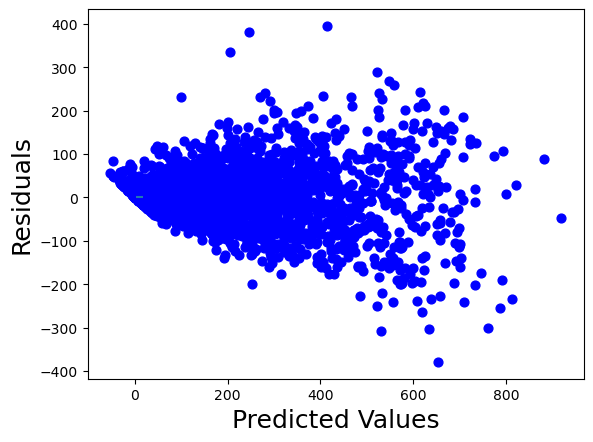

In [81]:
# Visualization: a residual plot to compare the model predictions and ground truth targets. For each example, the residual value
# is the subtraction between the prediction and ground truth target.
# We can see that the points in the residual plot are randomly dispersed around the horizontal axis y = 0,
# which indicates the fitted regression model is appropriate for the Abalone data

residuals = ground_truth_label.values[:, 0] - model_predictions
plt.scatter(model_predictions, residuals, color="blue", s=40)
plt.hlines(y=0, xmin=4, xmax=18)
plt.xlabel("Predicted Values", fontsize=18)
plt.ylabel("Residuals", fontsize=18)
plt.show()

In [82]:
# Evaluate the model predictions quantitatively.
eval_r2_score = r2_score(ground_truth_label.values, model_predictions)
eval_mse_score = mean_squared_error(ground_truth_label.values, model_predictions)
eval_mae_score = mean_absolute_error(ground_truth_label.values, model_predictions)
print(
    f"{bold}Evaluation result on validation data{unbold}:{newline}"
    f"{bold}{r2_score.__name__}{unbold}: {eval_r2_score}{newline}"
    f"{bold}{mean_squared_error.__name__}{unbold}: {eval_mse_score}{newline}"
    f"{bold}{mean_absolute_error.__name__}{unbold}: {eval_mae_score}{newline}"
)

Evaluation result on test data:
r2_score: 0.882448092441793
mean_squared_error: 3809.5664921115913
mean_absolute_error: 41.40067279202278



---
**Predict Test Data**

---
Now that we have a hosted endpoint running, we can make real-time predictions from our model very easily, simply by making a http POST request. But first, we'll need to set up serializers and deserializers for passing our test_data NumPy arrays to the model behind the endpoint.

Now, we'll use a simple function to:

1. Loop over our test dataset
2. Split it into mini-batches of rows
3. Convert those mini-batchs to CSV string payloads
4. Retrieve mini-batch predictions by invoking the XGBoost endpoint
5. Collect predictions and convert from the CSV output our model provides into a NumPy array

In [101]:
test_data = pd.read_csv("test.csv", header=None)
test_data

,0,1,2,3,4,5,6,7,8,9
0,2.0,5.0,0.0,0.826087,0.0,1.000000,0.0,0.812500,0.27,0.228047
1,0.0,0.0,0.0,0.869565,1.0,0.166667,0.0,0.229167,0.41,0.263195
2,3.0,9.0,0.0,0.086957,0.0,0.833333,1.0,0.312500,0.66,0.333373
3,1.0,4.0,0.0,0.826087,0.0,0.333333,1.0,0.791667,0.52,0.421065
4,0.0,0.0,0.0,0.000000,0.0,0.666667,1.0,0.250000,0.56,0.456213
...,...,...,...,...,...,...,...,...,...,...
1733,1.0,3.0,2.0,0.086957,0.0,0.833333,1.0,0.250000,0.93,0.228047
1734,2.0,7.0,0.0,0.217391,0.0,0.833333,1.0,0.645833,0.83,0.000000
1735,2.0,5.0,0.0,0.565217,0.0,1.000000,0.0,0.750000,0.40,0.333373
1736,3.0,9.0,0.0,0.826087,0.0,1.000000,0.0,0.229167,0.87,0.421065


In [103]:
content_type = "text/csv"


def query_endpoint(encoded_tabular_data):
    client = boto3.client("runtime.sagemaker")
    response = client.invoke_endpoint(
        EndpointName=endpoint_name, ContentType=content_type, Body=encoded_tabular_data
    )
    return response


def parse_resonse(query_response):
    predictions = json.loads(query_response["Body"].read())
    return np.array(predictions["prediction"])


query_response = query_endpoint(test_data.to_csv(header=False, index=False).encode("utf-8"))
model_predictions = parse_resonse(query_response)
model_predictions

array([429.34030151, 104.54148102,   7.42716503, ..., 455.45977783,
        72.37901306,  26.10587692])

In [108]:
pd.concat([test_data, pd.Series(model_predictions, name="target")], axis=1)

,0,1,2,3,4,5,6,7,8,9,target
0,2.0,5.0,0.0,0.826087,0.0,1.000000,0.0,0.812500,0.27,0.228047,429.340302
1,0.0,0.0,0.0,0.869565,1.0,0.166667,0.0,0.229167,0.41,0.263195,104.541481
2,3.0,9.0,0.0,0.086957,0.0,0.833333,1.0,0.312500,0.66,0.333373,7.427165
3,1.0,4.0,0.0,0.826087,0.0,0.333333,1.0,0.791667,0.52,0.421065,450.124512
4,0.0,0.0,0.0,0.000000,0.0,0.666667,1.0,0.250000,0.56,0.456213,17.856045
...,...,...,...,...,...,...,...,...,...,...,...
1733,1.0,3.0,2.0,0.086957,0.0,0.833333,1.0,0.250000,0.93,0.228047,0.932630
1734,2.0,7.0,0.0,0.217391,0.0,0.833333,1.0,0.645833,0.83,0.000000,19.261564
1735,2.0,5.0,0.0,0.565217,0.0,1.000000,0.0,0.750000,0.40,0.333373,455.459778
1736,3.0,9.0,0.0,0.826087,0.0,1.000000,0.0,0.229167,0.87,0.421065,72.379013


In [109]:
# Evaluate the model predictions quantitatively.
eval_r2_score = r2_score(y_test.values, model_predictions)
eval_mse_score = mean_squared_error(y_test.values, model_predictions)
eval_mae_score = mean_absolute_error(y_test.values, model_predictions)
print(
    f"{bold}Evaluation result on test data{unbold}:{newline}"
    f"{bold}{r2_score.__name__}{unbold}: {eval_r2_score}{newline}"
    f"{bold}{mean_squared_error.__name__}{unbold}: {eval_mse_score}{newline}"
    f"{bold}{mean_absolute_error.__name__}{unbold}: {eval_mae_score}{newline}"
)

Evaluation result on test data:
r2_score: 0.8838803281739873
mean_squared_error: 3589.6950114619613
mean_absolute_error: 40.60354784084752



In [ ]:
# s3_input_test = TrainingInput(
#     s3_data="s3://{}/{}/test/".format(bucket, prefix), content_type="csv", s3_data_type='S3Prefix'
# )

In [86]:
# def predict(data, rows=10):
#     split_array = np.array_split(data, int(data.shape[0] / float(rows) + 1))
#     predictions = ''
#     for array in split_array:
#         predictions = ','.join([predictions, predictor.predict(array).decode('utf-8')])
#     return np.fromstring(predictions, sep=',')


# predictions = predict(test_data.to_numpy())
# predictions
# predictions = np.array([float(num) for num in predictions])
# print(predictions)
# print ('Predicted Count', math.expm1(float(predictions[0])))

---
Next, we delete the endpoint corresponding to the finetuned model.

---

In [83]:
# Delete the SageMaker endpoint and the attached resources
predictor.delete_model()
predictor.delete_endpoint()